In [1]:
!pip install datasets

In [2]:
from datasets import load_dataset
import numpy as np
from IPython.display import display
from PIL import Image
import torch
import torchvision.transforms as transforms
import json
import requests
import matplotlib.pyplot as plt
import warnings
import torchvision.models as models
from torch.utils.data import DataLoader
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torch.nn import MSELoss
import torch.nn as nn
from torch.utils.data import random_split
import random


warnings.filterwarnings('ignore')
%matplotlib inline

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Using {device} for inference')

Using cuda for inference


Question: what are stained here with an immunohistochemical stain for cytokeratin 7?
Answer: bile duct cells and canals of hering


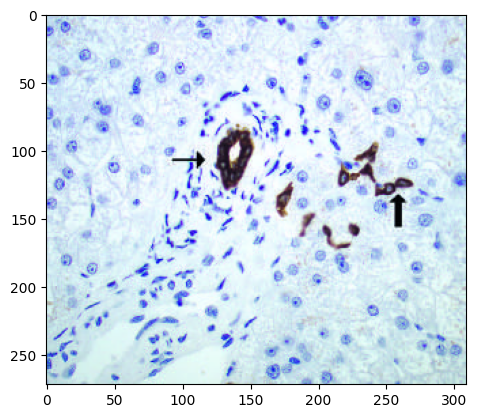

In [3]:
dataset = load_dataset("flaviagiammarino/path-vqa")
sample = dataset['train'][1]
PIL_image = Image.fromarray(np.array(sample['image'])).convert('RGB')
plt.imshow(sample['image'].convert('RGB'))
print("Question: {}".format(sample['question']))
print("Answer: {}".format(sample['answer']))

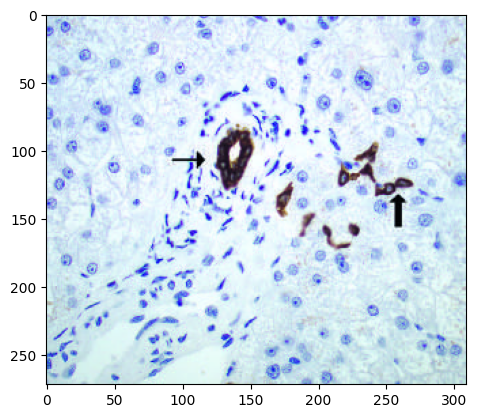

Question: where are liver stem cells (oval cells) located?
Answer: in the canals of hering


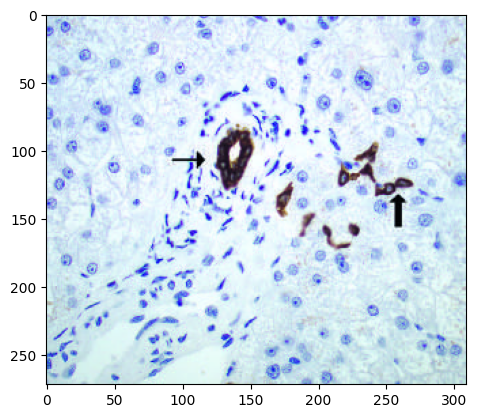

Question: what are stained here with an immunohistochemical stain for cytokeratin 7?
Answer: bile duct cells and canals of hering


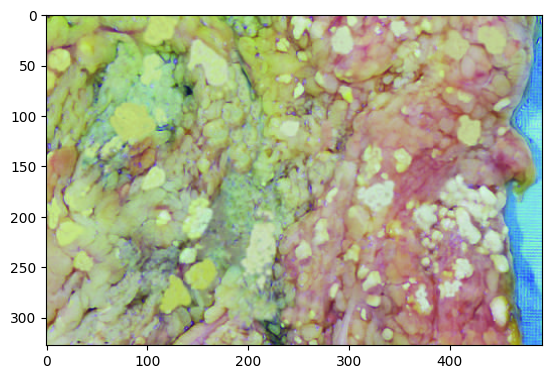

Question: what do the areas of white chalky deposits represent?
Answer: foci of fat necrosis


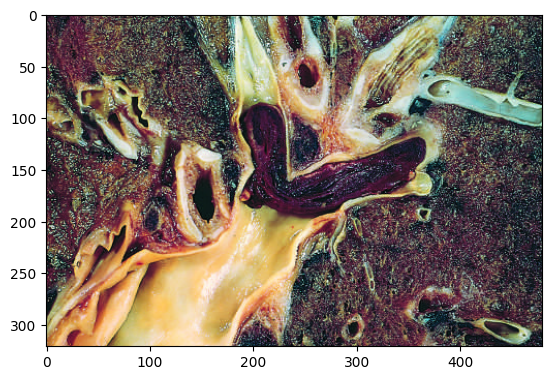

Question: is embolus derived from a lower-extremity deep venous thrombus lodged in a pulmonary artery branch?
Answer: yes


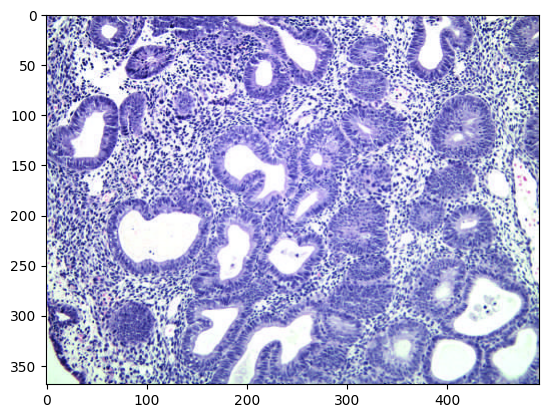

Question: how is hyperplasia without atypia characterized?
Answer: by nests of closely packed glands


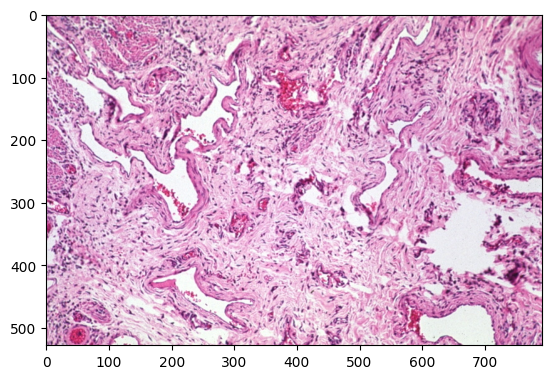

Question: is normal palmar creases present?
Answer: no


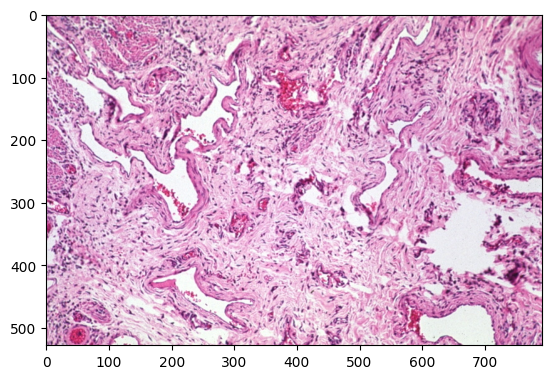

Question: where is this from?
Answer: gastrointestinal system


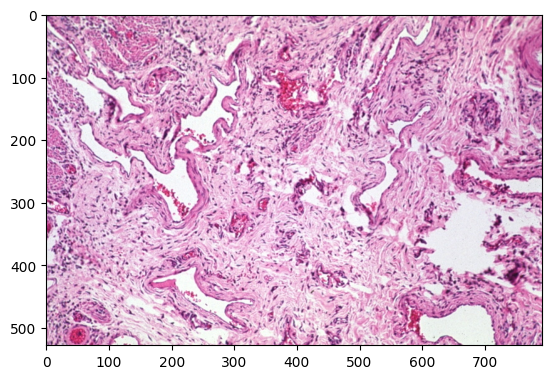

Question: what is present?
Answer: gastrointestinal


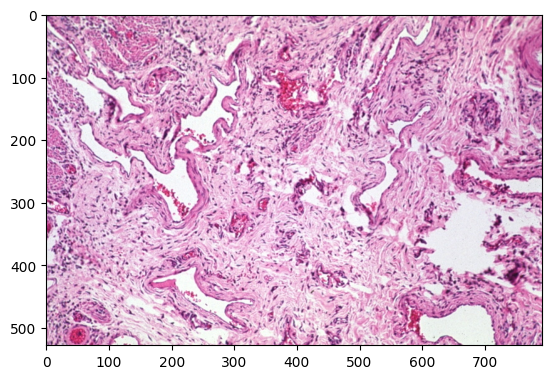

Question: what is present?
Answer: esophagus


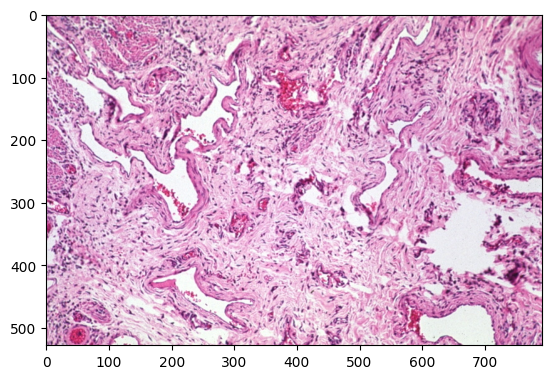

Question: what is present?
Answer: varices


In [6]:
i=0
for x in dataset['train']:
  i+=1
  PIL_image = Image.fromarray(np.array(x['image'])).convert('RGB')
  plt.imshow(x['image'].convert('RGB'))
  plt.show()
  print("Question: {}".format(x['question']))
  print("Answer: {}".format(x['answer']))
  if i==10:
    break


In [7]:
class CustomDataset(Dataset):
    def __init__(self, dataset_name, transform=None):
        self.dataset_name = dataset_name
        self.transform = transform
        self.dataset= load_dataset("flaviagiammarino/path-vqa")

    def __len__(self):
        return self.dataset[self.dataset_name].num_rows

    def __getitem__(self, idx):

        if self.transform:
            image = self.transform(self.dataset[self.dataset_name][idx]['image'].convert('RGB'))

        return image

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [8]:
dataset = CustomDataset(dataset_name='train', transform=transform)
dataset_test = CustomDataset(dataset_name='test', transform=transform)
batch_size =16

# Create DataLoaders for train and test sets
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(dataset_test, batch_size=batch_size, shuffle=False)
len(test_loader)

420

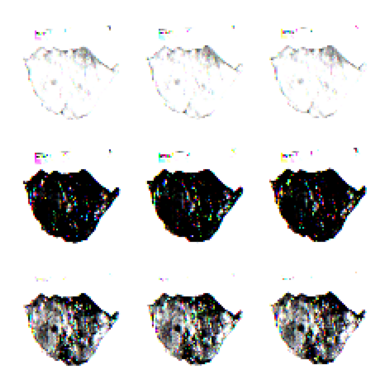

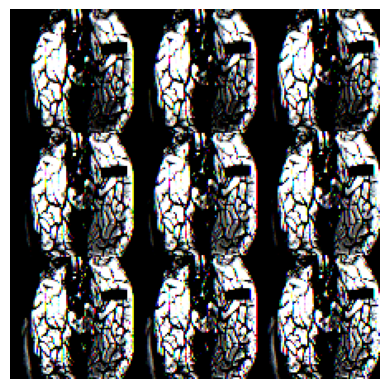

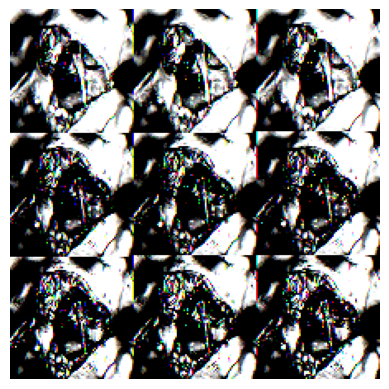

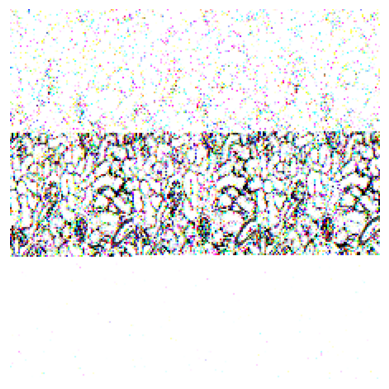

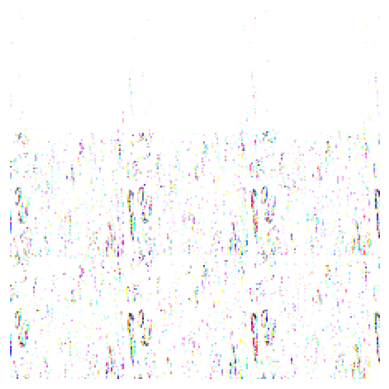

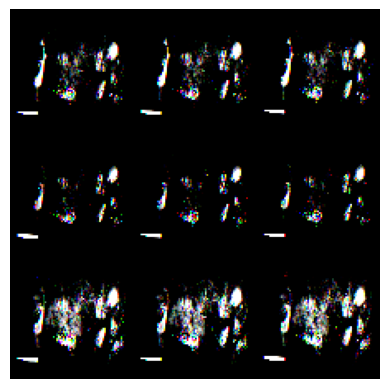

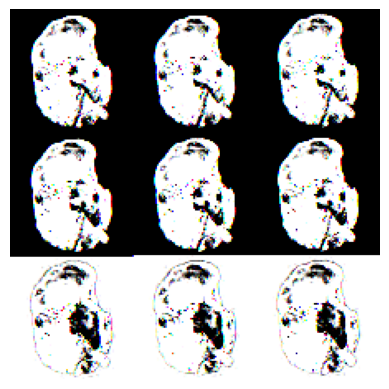

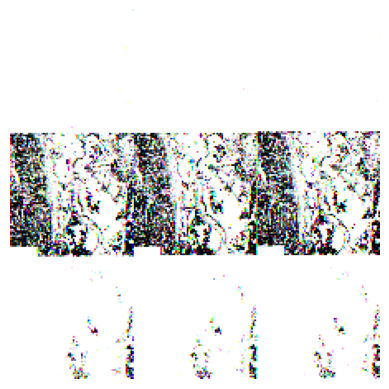

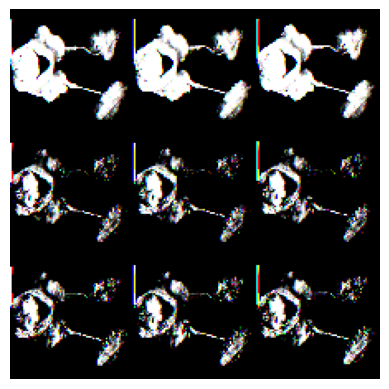

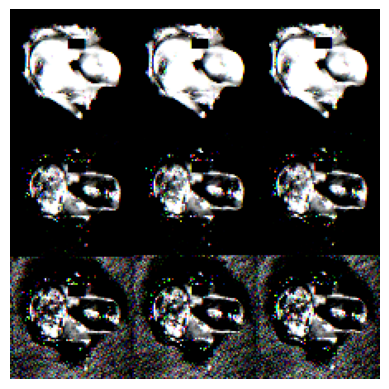

In [9]:
i=0
for x in train_loader:
  i+=1
  image = x[0]
  image = image.reshape(224,224,3)
  #image = Image.open(image_path)
  plt.imshow(image)
  plt.axis('off')  # Turn off axis numbers
  plt.show()
  if i==10:
    break



In [10]:
class ResNet152Encoder(nn.Module):
    def __init__(self):
        super(ResNet152Encoder, self).__init__()
        # Load pre-trained ResNet-152
        resnet152 = models.resnet152(pretrained=True)
        self.features = nn.Sequential(*list(resnet152.children())[:-1])

    def forward(self, x):
        x = self.features(x)
        return x
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder, self).__init__()
        self.decoder = nn.Sequential(
            # Start with the feature map of size [batch_size, 2048, 1, 1]
            nn.ConvTranspose2d(2048, 1024, kernel_size=7, stride=1, padding=0),  # Output size: [batch_size, 1024, 7, 7]
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(1024, 512, kernel_size=4, stride=2, padding=1),  # Output size: [batch_size, 512, 14, 14]
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1),  # Output size: [batch_size, 256, 28, 28]
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),  # Output size: [batch_size, 128, 56, 56]
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),  # Output size: [batch_size, 64, 112, 112]
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),  # Output size: [batch_size, 32, 224, 224]
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(32, 3, kernel_size=1, stride=1, padding=0),  # Output size: [batch_size, 3, 224, 224]
            nn.Sigmoid()  # Use Sigmoid to scale the output to the range [0, 1]
        )

    def forward(self, x):
        x = self.decoder(x)
        return x


class ResNet152Autoencoder(nn.Module):
    def __init__(self):
        super(ResNet152Autoencoder, self).__init__()
        self.encoder = ResNet152Encoder()

        self.decoder = Decoder()

    def forward(self, x):
        x = self.encoder(x)
        #x = x.view(x.size(0), 2048, 1, 1)
        x = self.decoder(x)
        return x

In [9]:
learning_rate = 0.001
batch_size = 32
num_epochs = 10

# Initialize the autoencoder and optimizer
autoencoder = ResNet152Autoencoder()
optimizer = optim.Adam(autoencoder.parameters(), lr=learning_rate)

# Loss function
criterion = nn.MSELoss()

# Check if GPU is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
autoencoder = autoencoder.to(device)

# Training Loop
for epoch in range(num_epochs):
    for data in train_loader:
        img = data.to(device)

        # Forward pass
        outputs = autoencoder(img)
        print(outputs.size())
        print(img.size())
        loss = criterion(outputs, img)


        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}')

torch.save(autoencoder.state_dict(), 'autoencoder_model.pth')

Downloading: "https://download.pytorch.org/models/resnet152-394f9c45.pth" to /root/.cache/torch/hub/checkpoints/resnet152-394f9c45.pth
100%|██████████| 230M/230M [00:02<00:00, 106MB/s]


Streaming output truncated to the last 5000 lines.
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 224, 224])
torch.Size([16, 3, 

In [11]:
autoencoder = ResNet152Autoencoder()

In [12]:
autoencoder = autoencoder.to(device)
autoencoder.load_state_dict(torch.load('/content/autoencoder_model.pth', map_location=device))
autoencoder.eval()

ResNet152Autoencoder(
  (encoder): ResNet152Encoder(
    (features): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(i

Question: are the lungs normal appearing?
Answer: no


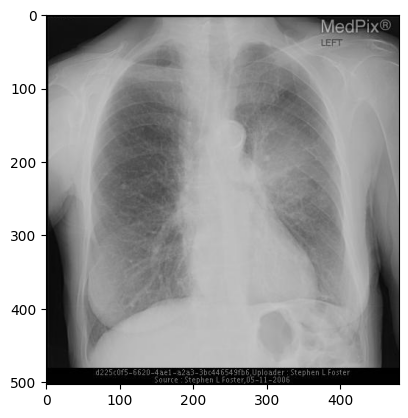

In [13]:
data=load_dataset("flaviagiammarino/vqa-rad")
sample = data['train'][1]
PIL_image = Image.fromarray(np.array(sample['image'])).convert('RGB')
plt.imshow(sample['image'].convert('RGB'))
print("Question: {}".format(sample['question']))
print("Answer: {}".format(sample['answer']))

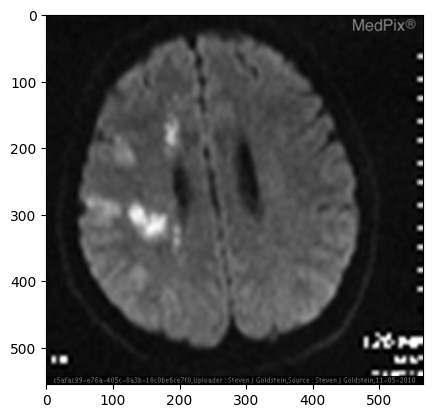

Question: are regions of the brain infarcted?
Answer: yes


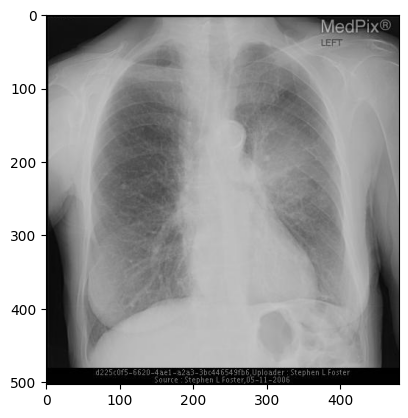

Question: are the lungs normal appearing?
Answer: no


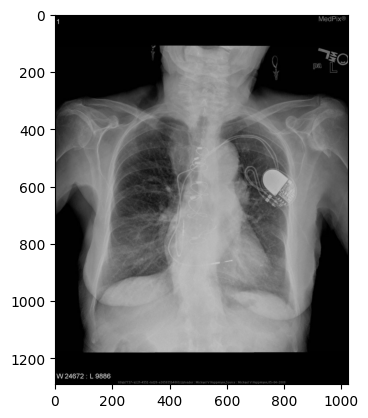

Question: which organ system is abnormal in this image?
Answer: cardiovascular


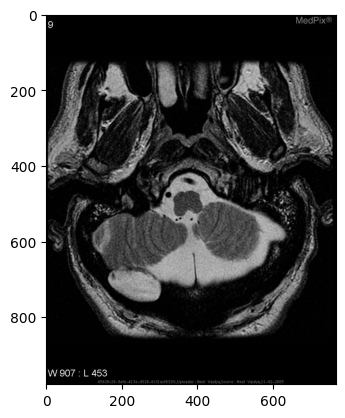

Question: is the lesion causing significant brainstem herniation?
Answer: no


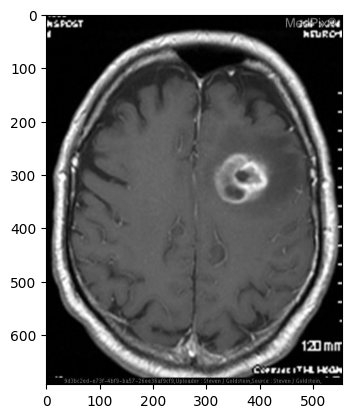

Question: how was this image taken?
Answer: mri


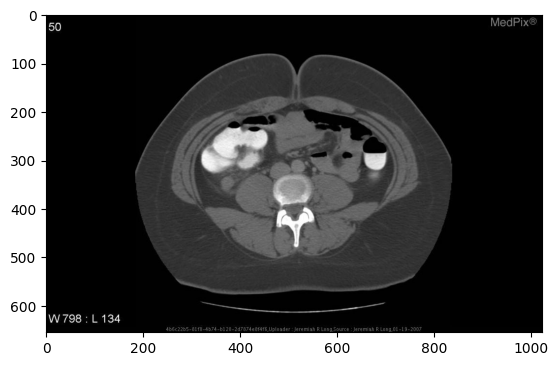

Question: what is the condition of the patient
Answer: blind loop syndrome


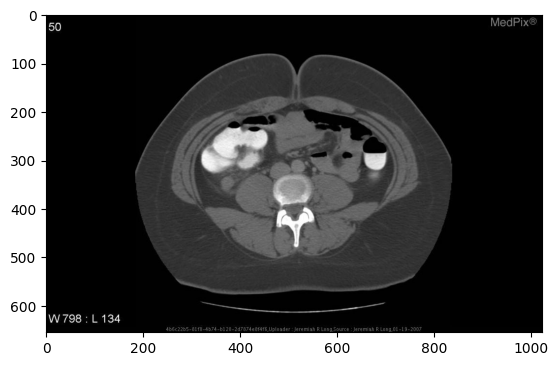

Question: what abnormality is seen?
Answer: blind-ending loop of bowel arising from the cecum


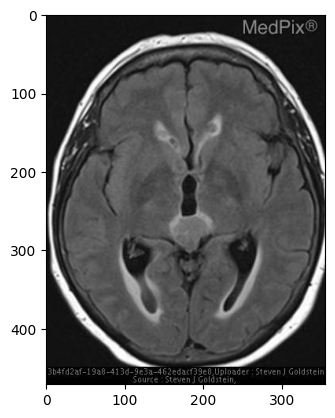

Question: what is the location of the mass?
Answer: pineal region


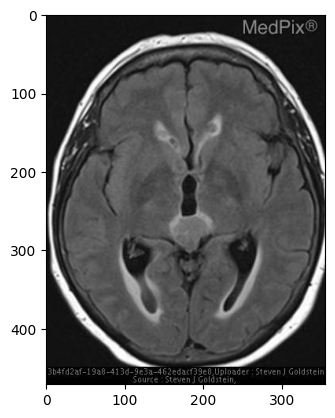

Question: where is the mass?
Answer: pineal region


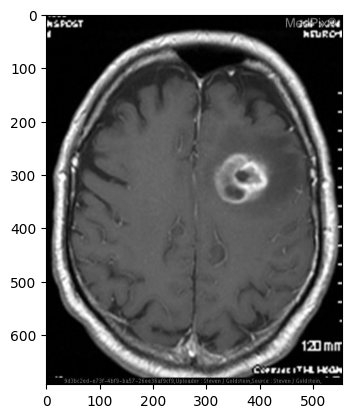

Question: is this image in the transverse plane?
Answer: yes


In [14]:
i=0
for x in data['train']:
  i+=1
  PIL_image = Image.fromarray(np.array(x['image'])).convert('RGB')
  plt.imshow(x['image'].convert('RGB'))
  plt.show()
  print("Question: {}".format(x['question']))
  print("Answer: {}".format(x['answer']))
  if i==10:
    break

In [15]:
class CustomDataset1(Dataset):
    def __init__(self, dataset_name, transform=None):
        self.dataset_name = dataset_name
        self.transform = transform
        self.dataset= load_dataset("flaviagiammarino/vqa-rad")

    def __len__(self):
        return self.dataset[self.dataset_name].num_rows

    def __getitem__(self, idx):

        if self.transform:
            image = self.transform(self.dataset[self.dataset_name][idx]['image'].convert('RGB'))

        return image

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [16]:
dataset = CustomDataset1(dataset_name='train', transform=transform)
dataset_test = CustomDataset1(dataset_name='test', transform=transform)
batch_size =16

# Create DataLoaders for train and test sets
train_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(dataset_test, batch_size=batch_size, shuffle=False)
len(test_loader)

29

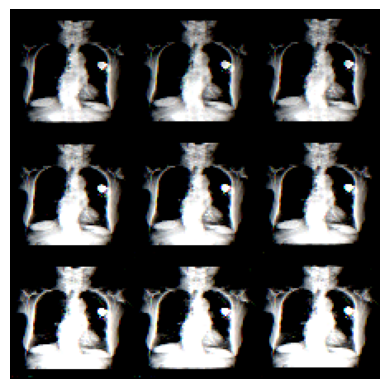

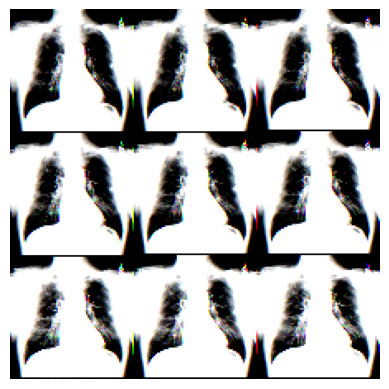

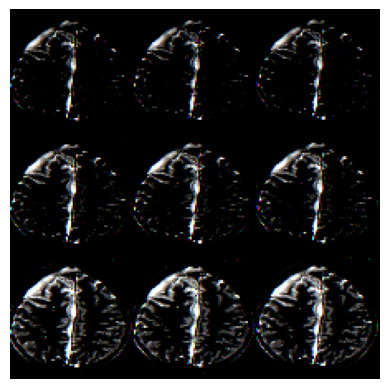

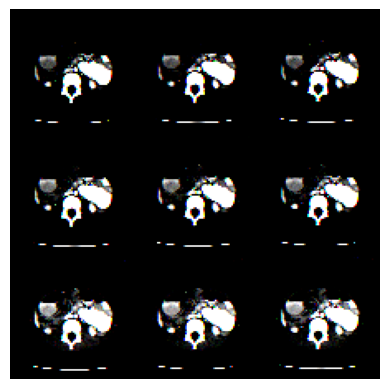

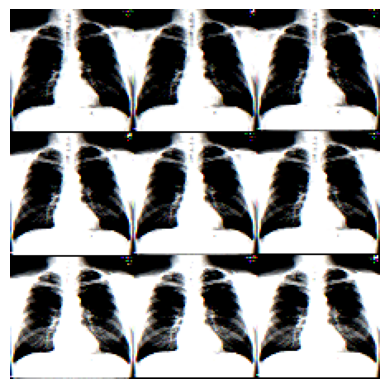

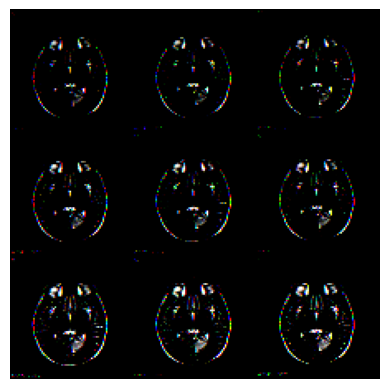

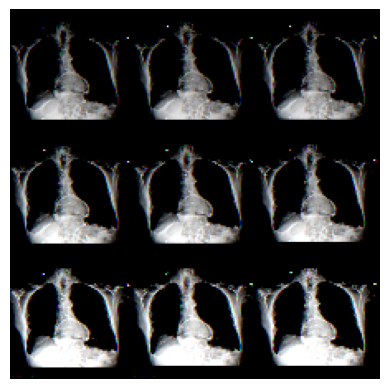

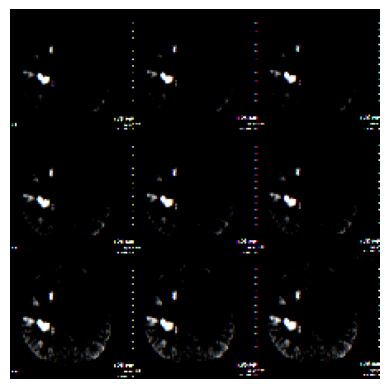

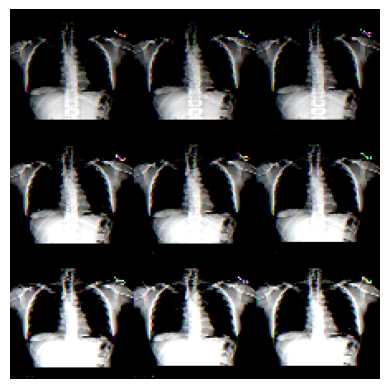

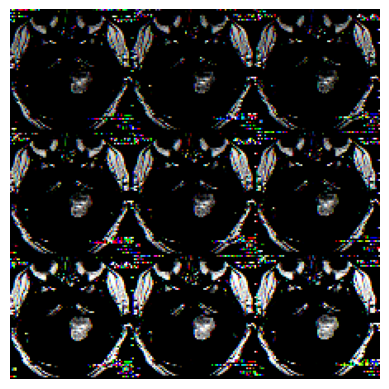

In [17]:
i=0
for x in test_loader:
  i+=1
  image = x[0]
  image = image.reshape(224,224,3)
  #image = Image.open(image_path)
  plt.imshow(image)
  plt.axis('off')  # Turn off axis numbers
  plt.show()
  if i==10:
    break

In [19]:
#Getting train embeddings
embeddings = []

with torch.no_grad():
    for data in train_loader:
        images = data.to(device)
        encoded_images = autoencoder.encoder(images)
        encoded_images = encoded_images.view(encoded_images.size(0), -1)
        embeddings.append(encoded_images.cpu().numpy())

embeddings = np.concatenate(embeddings, axis=0)

In [20]:
#Getting test embeddings
embeddings_test = []
with torch.no_grad():
    for data in test_loader:
        images = data.to(device)
        encoded_images = autoencoder.encoder(images)
        encoded_images = encoded_images.view(encoded_images.size(0), -1)
        embeddings_test.append(encoded_images.cpu().numpy())

embeddings_test = np.concatenate(embeddings_test, axis=0)

In [21]:
np.savetxt("embeddings.csv", embeddings, delimiter=",")
np.savetxt("embeddings_test.csv", embeddings_test, delimiter=",")
print(embeddings_test.shape)

(451, 2048)


In [22]:
from google.colab import files
files.download('/content/embeddings.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

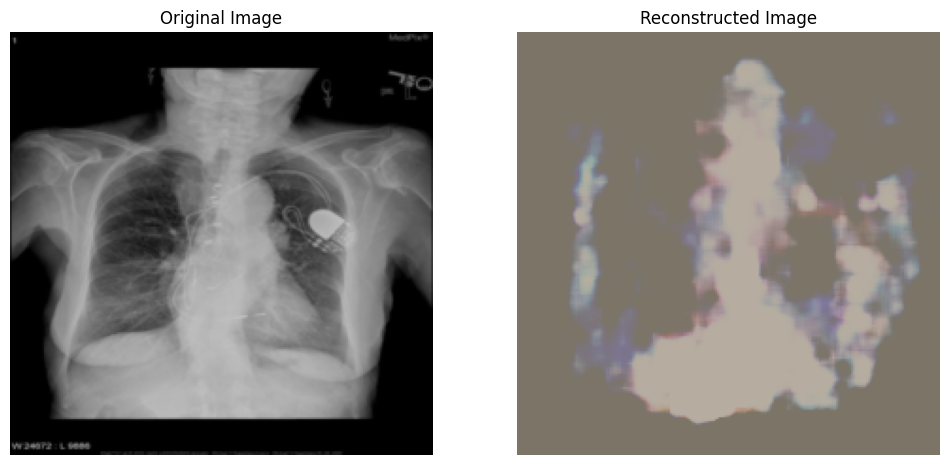

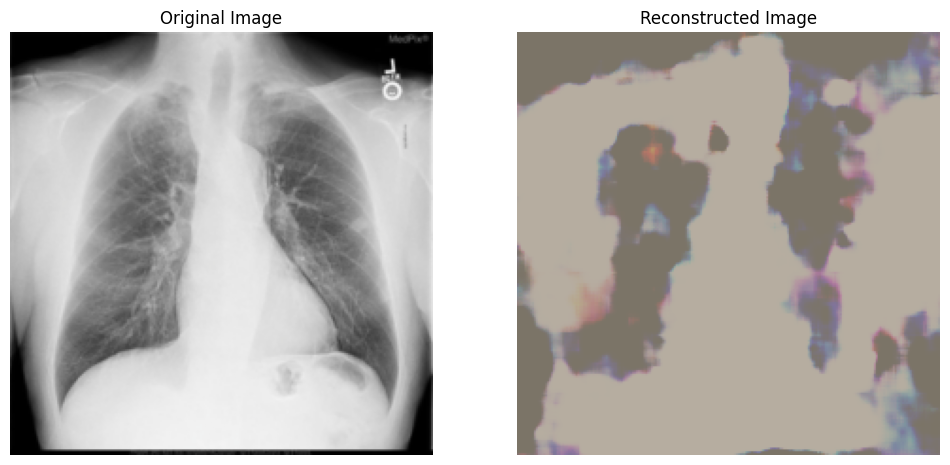

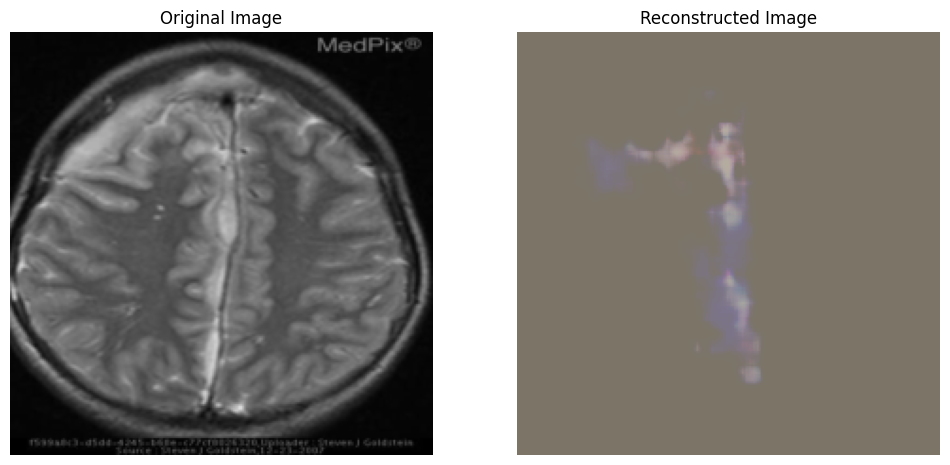

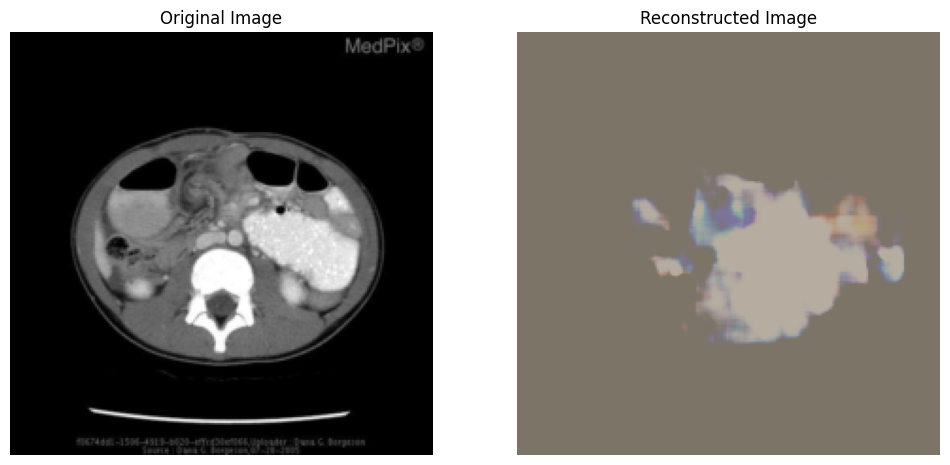

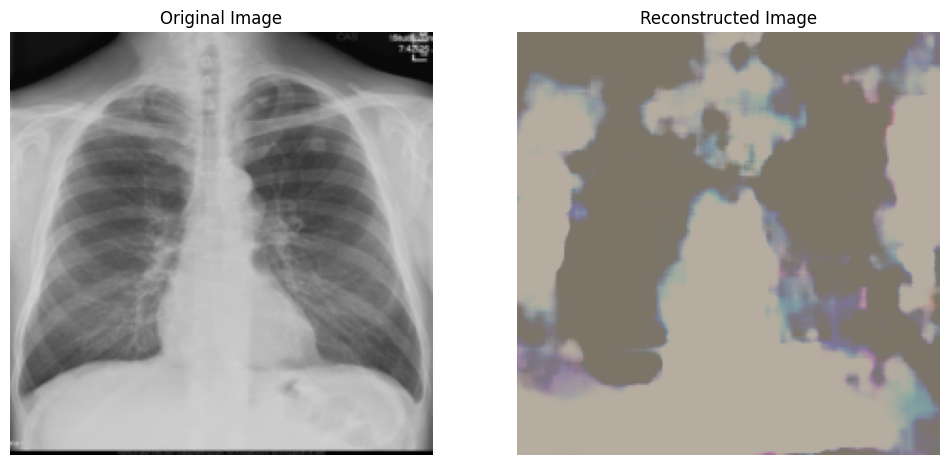

...

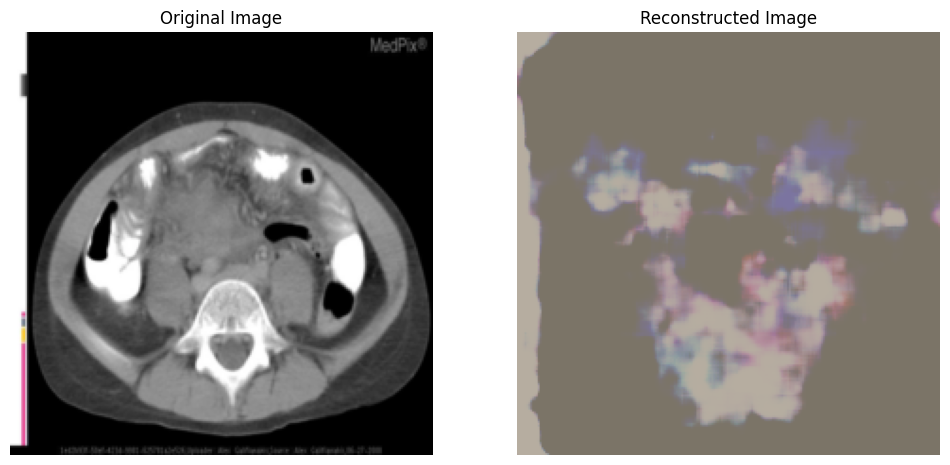

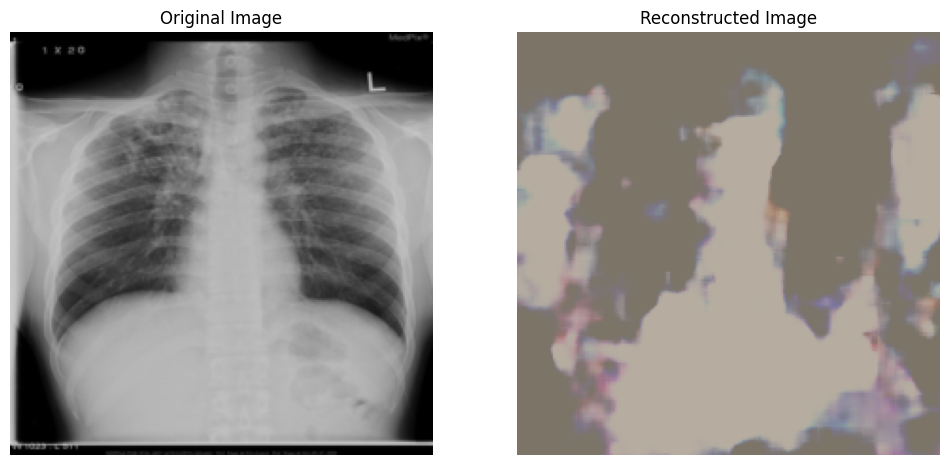

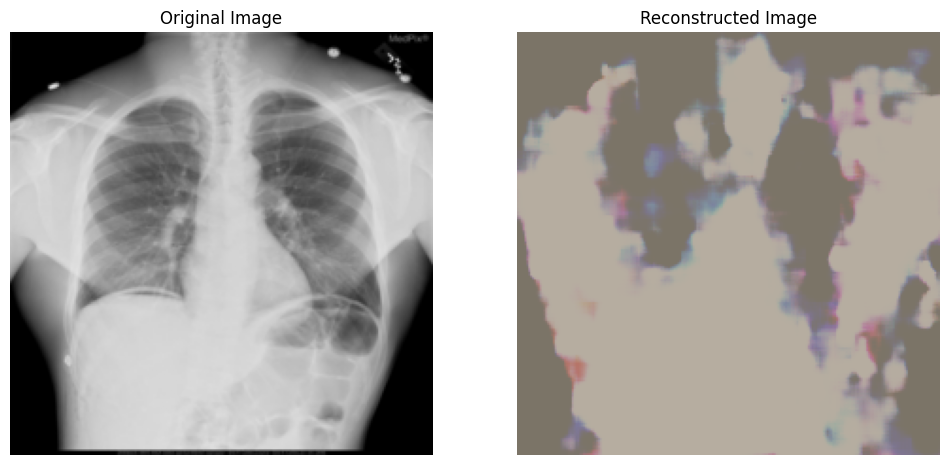

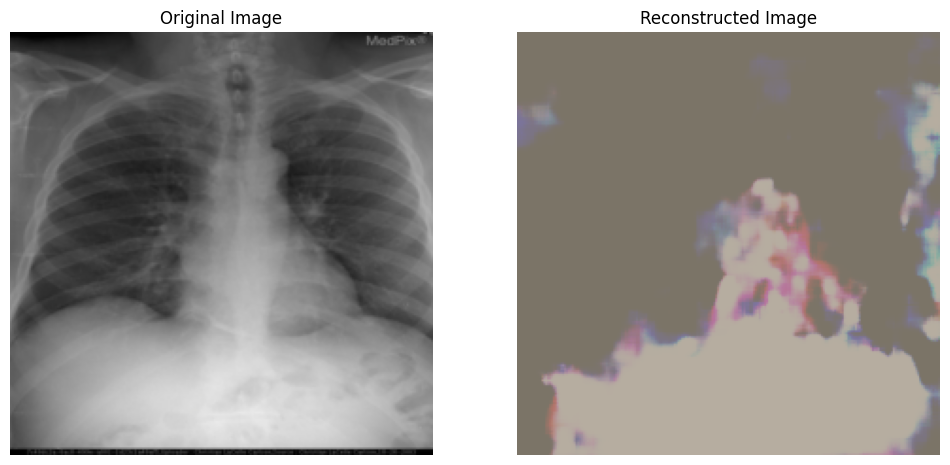

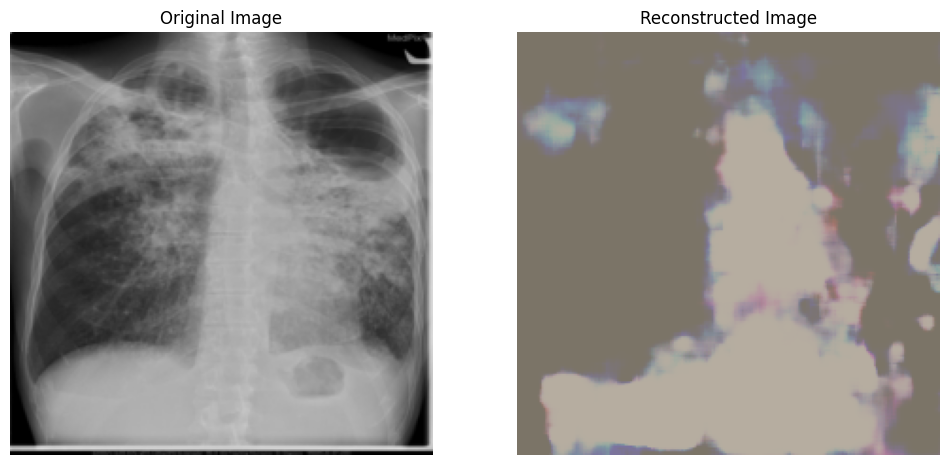

In [23]:
def denormalize(image):
    mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
    std = torch.tensor([0.229, 0.224, 0.225]).to(device)
    image = image * std[:, None, None] + mean[:, None, None]
    return image

# Process only one batch from the test_loader
for images in test_loader:
    images = images.to(device)
    encoded_images = autoencoder.encoder(images)
    decoded_images = autoencoder.decoder(encoded_images)

    # Clamp the output of the decoder
    decoded_images = decoded_images.clamp(0, 1)

    # Denormalize images if they were normalized initially
    original = denormalize(images[0]).detach().permute(1, 2, 0).cpu()
    reconstructed = denormalize(decoded_images[0]).detach().permute(1, 2, 0).cpu()


    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(reconstructed)
    plt.title('Reconstructed Image')
    plt.axis('off')

    plt.show()